# Triangle singularity in $\rho\pi\to\rho\pi$ rescattering
The exercise with Tobias: calculate triangle and compare to KT solutions

In [1]:
using QuadGK
using Plots
using LaTeXStrings
gr(fmt = :png)

Plots.GRBackend()

#### Just a plot of the diagram to agree where which masses are

In [2]:
function draw_triangle(m1sq="m1sq", m2sq="m2sq", m3sq="m3sq", M1sq="M1sq", M2sq="M2sq", M3sq="M3sq")
    vs = [-1,1+1im,1-1im]
    plot(vs, lab="", l=(2,:black), seriestype=:shape, c=:white)
    for (v,d,t) in zip(vs,[-1,1,1],[M2sq,M3sq,M1sq])
        plot!(v.+[0,d], lab="", l=(2,:black), ann=(reim(v+d/2+0.1im)...,t))
    end
    scatter!(vs, lab="", m=(10,:c,:black))
    [annotate!([(reim((v+w)/2-0.15)...,d)]) for (v,w,d) in zip(vs,[vs[2:end]...,vs[1]],[m1sq,m2sq,m3sq])]
    plot!(xlab="", ylab="", grid=false, xaxis=false,yaxis=false, size=(300,200))
end

draw_triangle (generic function with 7 methods)

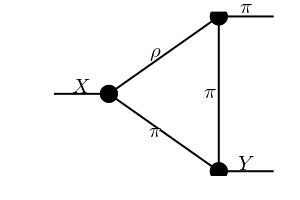

In [3]:
draw_triangle(L"\rho",L"\pi",L"\pi",L"Y",L"X",L"\pi")

#### Calculation of the triangle diagram using Feynman parameters

In [4]:
function Isc(m1sq, m2sq, m3sq, M1sq, M2sq, M3sq)
    function integrand(x)
        A = M1sq;
        B = m2sq + x*M2sq - (1-x)*M1sq - x*M3sq-m3sq;
        C = x*m1sq + (1-x)*m3sq - x*(1-x)*M2sq;
        D = B^2-4*A*C;
        y1, y2 = (-B .- sqrt(D) .* [1.0, -1.0]) ./ (2*A);
        return (log((1-x-y2)/(-y2))-log((1-x-y1)/(-y1)))/(A*(y2-y1))
    end
    integr = quadgk(integrand, 0, 1)[1];
    return integr/(16*π^2);
end

Isc (generic function with 1 method)

In [5]:
const mπ = 0.14; const mπ2 = mπ^2;
const mρ = 0.7755; const mρ2 = mρ^2;
const Γρ = 0.002; # 2 MeV
const mX = 1.02;

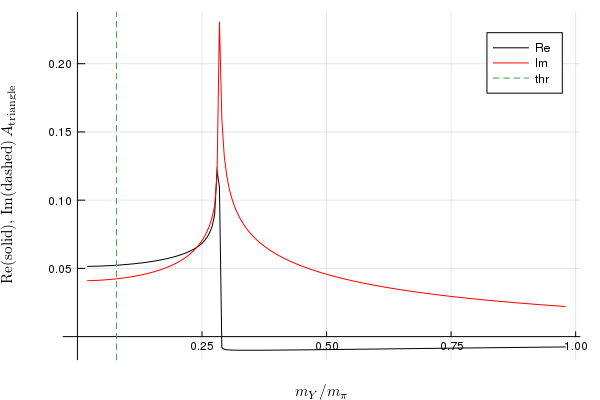

In [6]:
ell = LinRange(mπ2,50mπ2,200)
data_a1 = [Isc(mρ^2-1im*mρ*Γρ,mπ2,mπ2,e^2,mX^2,mπ2) for e in ell];
plot(ell, [real.(data_a1) imag.(data_a1)], lab=["Re" "Im"], lc=[:black :red], frame=:origin,
    xlab=L"m_Y/m_\pi",
    ylab=L"\mathrm{Re(solid)},\,\mathrm{Im(dashed)}\,A_\mathrm{triangle}")
vline!([4mπ2],lab="thr",ls=:dash)

#### The enhancement in Imag part is triangle singularity

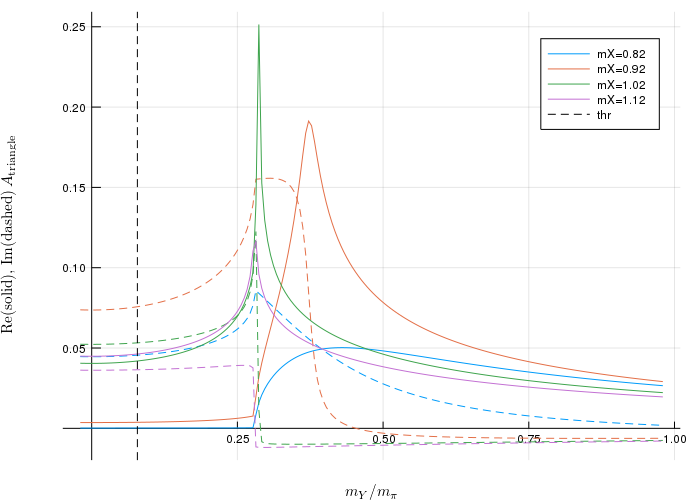

In [7]:
ell = LinRange(-mπ2,50mπ2,200)
plot(frame=:origin, xlab=L"m_Y/m_\pi", ylab=L"\mathrm{Re(solid)},\,\mathrm{Im(dashed)}\,A_\mathrm{triangle}")
for (i,mXi)=enumerate(LinRange(mπ+mρ-0.1,mπ+mρ+0.2,4))
    data_a1 = [Isc(mρ^2-1im*mρ*Γρ,mπ2,mπ2,e^2,mπ2,mXi^2) for e in ell];
    plot!(ell, [real.(data_a1) imag.(data_a1)], ls=[:dash :solid], lc=palette(:auto)[i],
        lab=["" "mX=$(round(mXi; digits=2))"], lw=1.1)
end
vline!([4mπ2], l=(:dash,1,:black), lab="thr", size=(700,500))